# Trade-off experiments

### Imports

In [1]:
import logging
import math
import warnings
from pathlib import Path
from typing import Iterable

import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import torch

from zprp.models.gatys.data import GatysDataModule
from zprp.models.gatys.model import GatysNST

In [2]:
LOG_PATH = "lightning_logs"
LOG_NAME = "gatys_tradeoff"
DATA_PATH = Path("../data/gatys")

In [3]:
torch.set_float32_matmul_precision("high")
# lightning complaining about using only one worker in DataLoader
warnings.filterwarnings("ignore", ".*does not have many workers.*")
# silence hardware summary on every `fit`
logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

# Tradeoff Experiments

#### Experiment Method

In [4]:
def experiment(content_name: str, style_name: str, epochs: int = 100, ratio: float = 1) -> GatysNST:
    img_size = 512
    dm = GatysDataModule(
        content_path=DATA_PATH / f"content/{content_name}.jpg",
        style_path=DATA_PATH / f"style/{style_name}.jpg",
        img_size=img_size,
    )
    dm.setup("fit")
    content_img, style_img = dm.train[0]

    tb_logger = pl_loggers.TensorBoardLogger(save_dir=LOG_PATH, name=LOG_NAME)

    model = GatysNST(content_img=content_img, style_img=style_img, content_style_weights=(1e-5, 1e0 * ratio))

    trainer = pl.Trainer(
        max_epochs=epochs,
        logger=tb_logger,
        enable_progress_bar=False,
        enable_checkpointing=False,
        log_every_n_steps=1,
        enable_model_summary=False,
    )
    trainer.fit(model, dm)

    return model


def display_experiment(title: str, model: GatysNST) -> None:
    final_img = model.image.cpu().numpy()
    plt.figure(figsize=(12, 6))
    plt.imshow(np.transpose(final_img, axes=(1, 2, 0))[:, :, ::-1])
    plt.title(title)
    plt.show()


def display_series(title: str, models: Iterable[GatysNST], subtitles: Iterable[str]) -> None:
    images = [model.image.cpu().numpy() for model in models]
    fig, axs = plt.subplots(math.ceil(len(images) / 3), 3, figsize=(12, 1.7 * math.ceil(len(images))))
    fig.suptitle(title)
    for ax, (title, image) in zip(axs.reshape(-1), zip(subtitles, images)):
        ax.imshow(np.transpose(image, axes=(1, 2, 0))[:, :, ::-1])
        ax.set_title(title)

    for ax in axs.reshape(-1):
        ax.axis("off")
    plt.show()

### Find maximum ratio

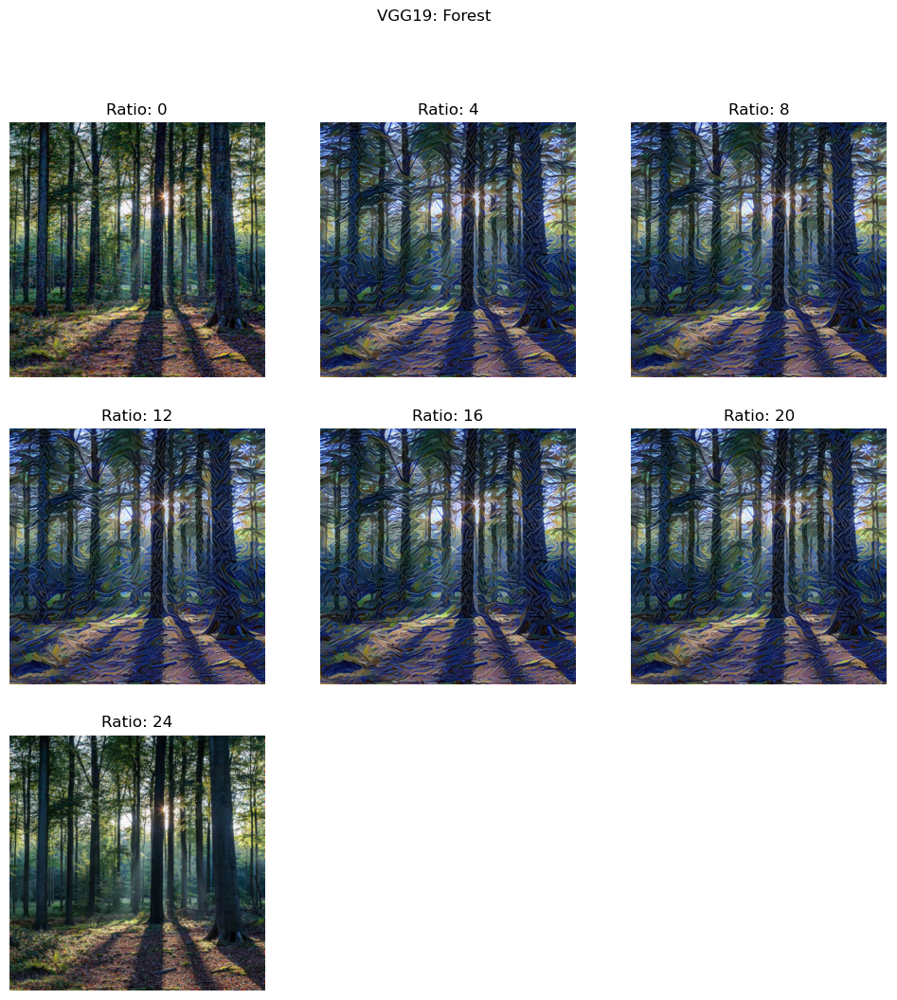

In [5]:
ratios = [0, 4, 8, 12, 16, 20, 24]
tmodels = [experiment("forest", "gogh", 100, ratio=10**ratio) for ratio in ratios]
display_series("VGG19: Forest", tmodels, [f"Ratio: {r}" for r in ratios])

## 1) Single image vs multiple styles

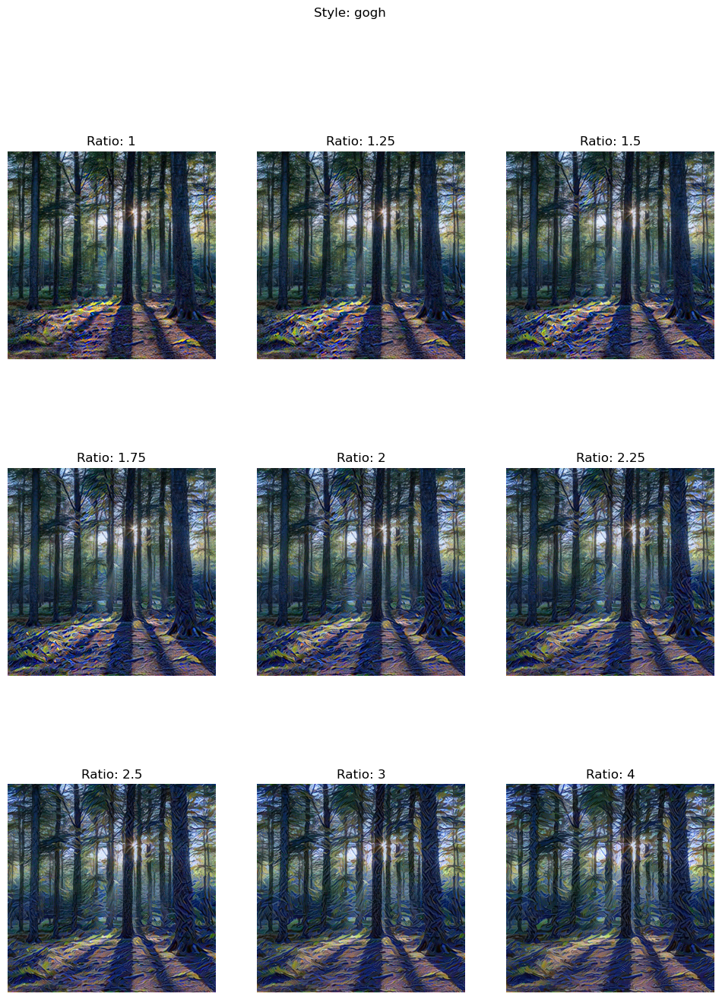

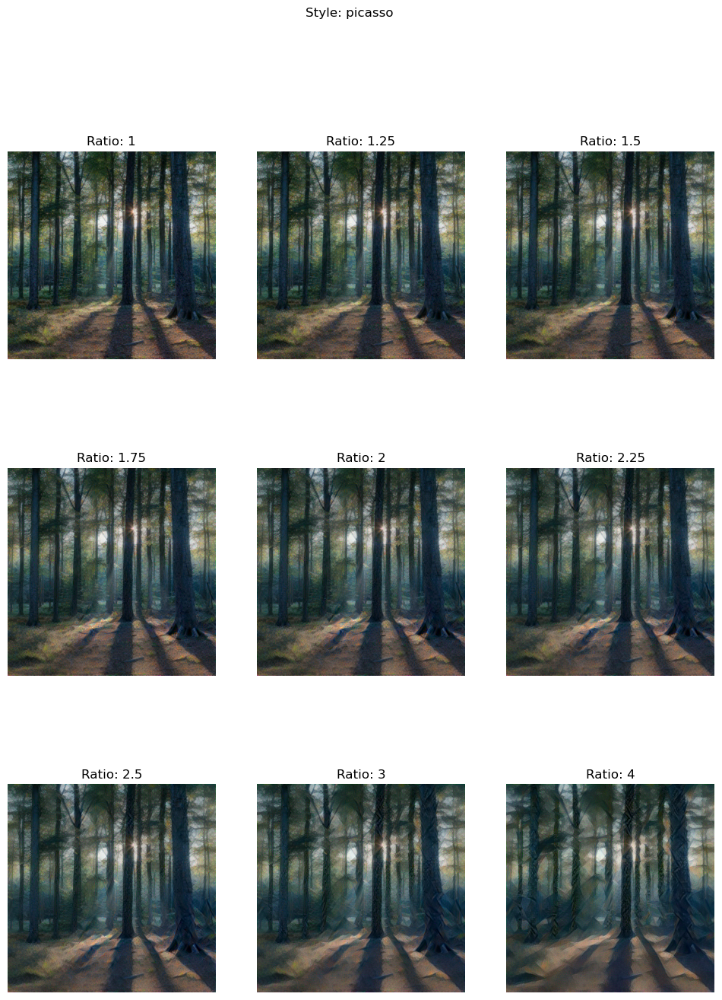

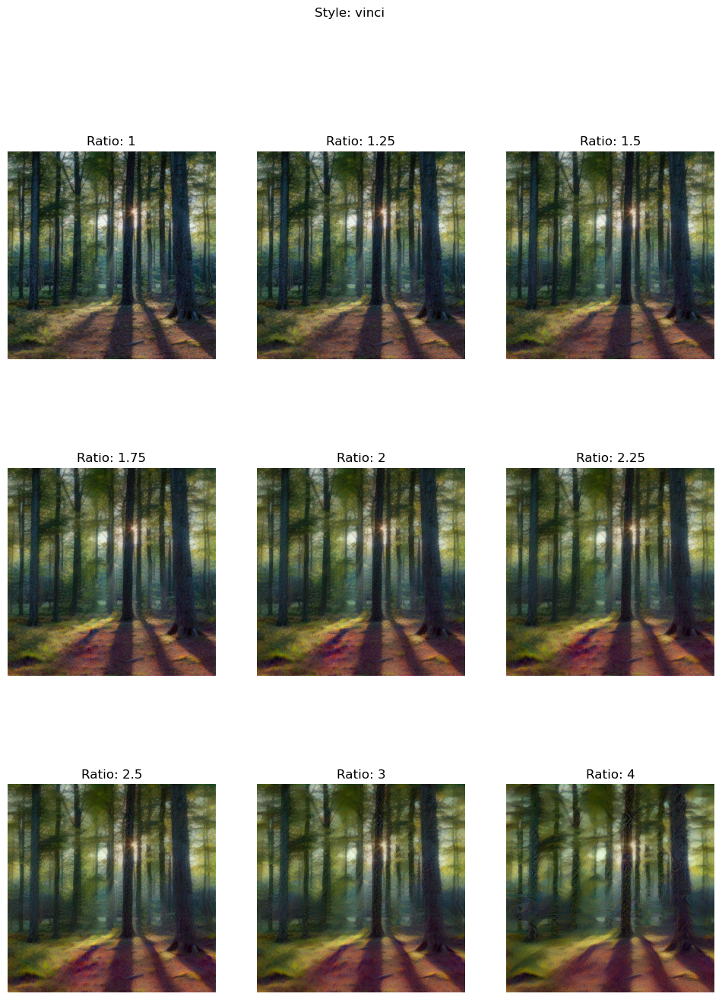

In [6]:
R = [1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 3, 4]

for style in ["gogh", "picasso", "vinci"]:
    tmodels = [experiment("forest", style, 100, ratio=10**ratio) for ratio in R]
    display_series(f"Style: {style}", tmodels, [f"Ratio: {r}" for r in R])

## 2) Single style vs multiple images

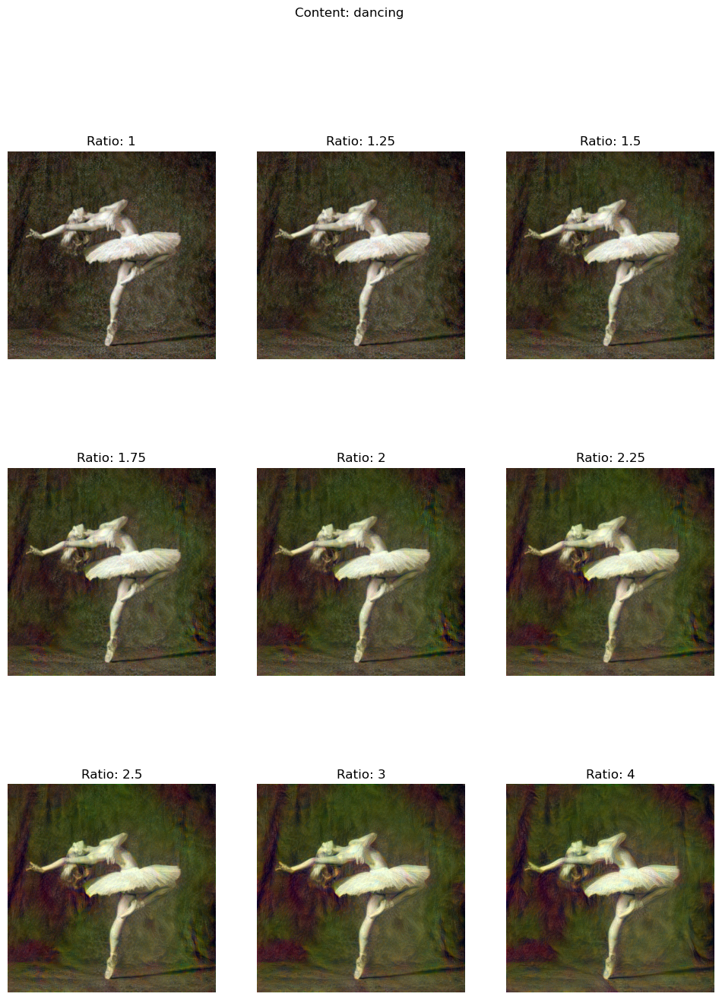

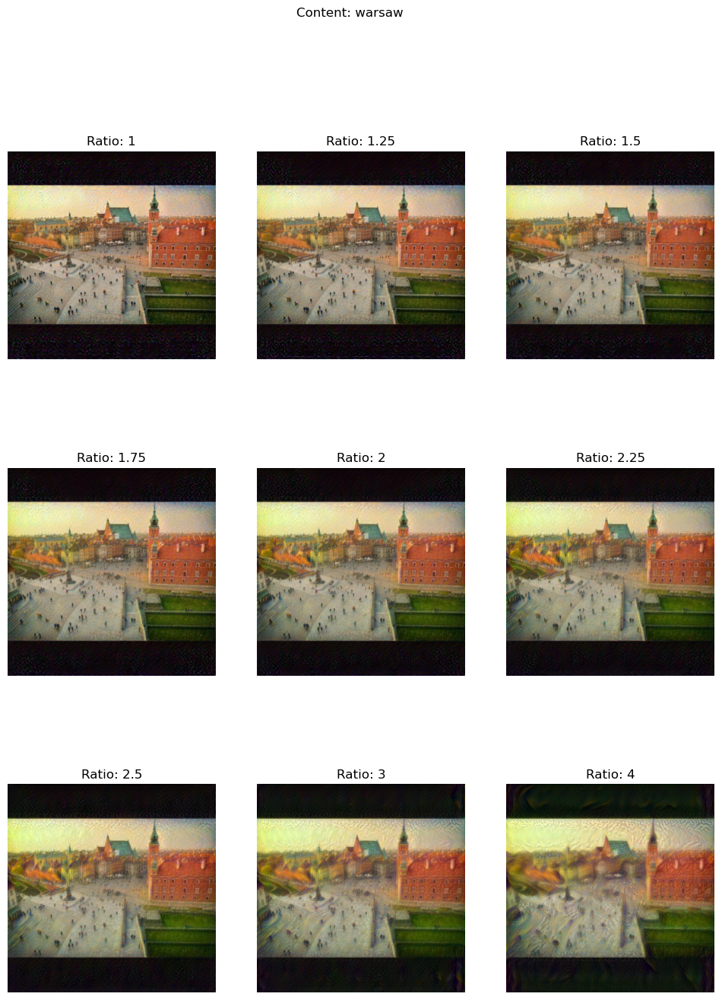

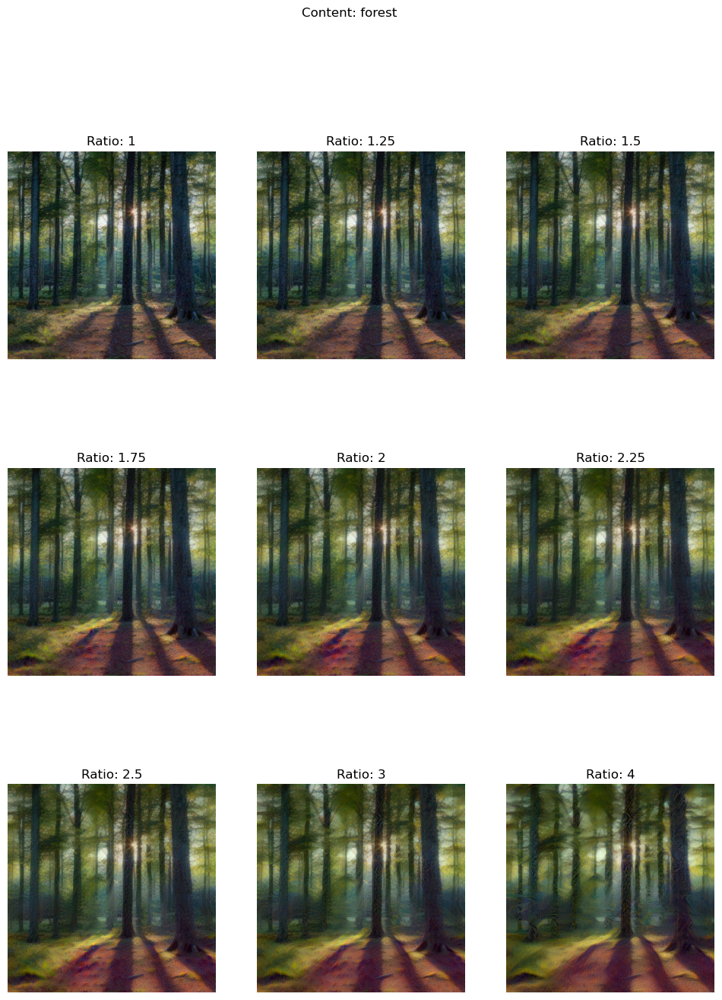

In [7]:
for content in ["dancing", "warsaw", "forest"]:
    tmodels = [experiment(content, "vinci", 100, ratio=10**ratio) for ratio in R]
    display_series(f"Content: {content}", tmodels, [f"Ratio: {r}" for r in R])

## 3) Multiple styles vs multiple images

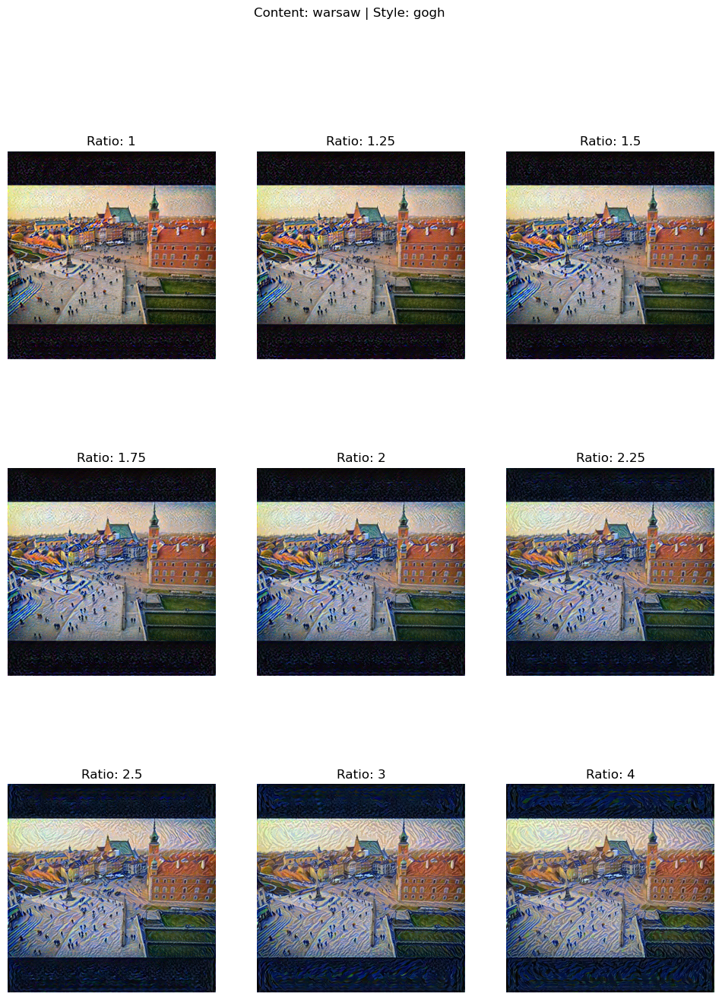

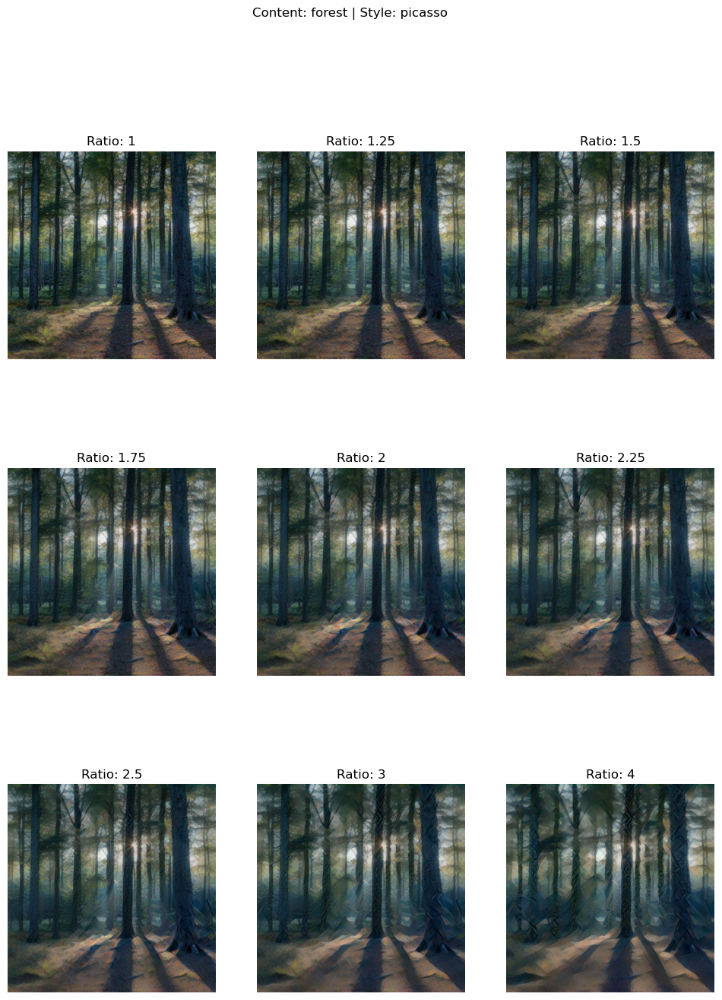

In [8]:
for content, style in zip(["warsaw", "forest"], ["gogh", "picasso"]):
    tmodels = [experiment(content, style, 100, ratio=10**ratio) for ratio in R]
    display_series(f"Content: {content} | Style: {style}", tmodels, [f"Ratio: {r}" for r in R])

# Conclusions

- there isn't a universal trade-off ratio between style and content; different styles and content images require different ratios.
- while it's possible to select a single ratio for a particular style to generate pleasing outputs, selecting a single ratio for a content image is not feasible.
- the inability to select a single value for the ratio necessitates defining a range of ratios that yield satisfactory results—where the style is discernible yet the image remains akin to the original.
- excessive ratios lead to numerical instability and cancels out the style effect.